# Rainfall Prediction

# Importing Necessary libraries





In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score

import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from sklearn.model_selection import train_test_split

In [2]:
!pip install kaggle

 ## Importing the dataset for kaggle

1.First download json file for kaggle site.

2.To download the json file go to kaggle
  site and goto setting options then press 'Create New Token' from API option.

3.By pressing the 'Create New Token' the
 json file will be downloaded in your desktop.

 4.Now,upload the json file in google colab.

In [3]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

### Getting the dataset

1.First goto kaggle site and select the
  dataset you want to access.

2.Then copy that dataset API Command from  
  that kaggle site.

3.Now, paste in the google colab cell.

4.keep '!' before that API Command and
  execute the cell

In [4]:
!kaggle datasets download -d nuttidalapthanachai/cloud-image-dataset

 87% 77.0M/88.1M [00:00<00:00, 93.7MB/s]
100% 88.1M/88.1M [00:00<00:00, 93.4MB/s]


### Unzipping the dataset

In [5]:
# extracting the compressed dataset
from zipfile import ZipFile


dataset = '/content/cloud-image-dataset.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')


The dataset is extracted


### Combining the train and test data and creating the new folder

In [6]:
import shutil
import os

# Define the paths to the two image folders
image_folder1 = '/content/train/Cloud'
image_folder2 = '/content/test/Cloud'

# Create a new directory to combine the images
combined_folder = '/content/cloudimages/'

# Create the combined folder if it doesn't exist
if not os.path.exists(combined_folder):
    os.makedirs(combined_folder)

# Function to copy all files from one folder to another
def copy_files(src_folder, dest_folder):
    for file_name in os.listdir(src_folder):
        shutil.copy(os.path.join(src_folder, file_name), dest_folder)

# Copy files from the first image folder to the combined folder
copy_files(image_folder1, combined_folder)

# Copy files from the second image folder to the combined folder
copy_files(image_folder2, combined_folder)

print("Images from both folders are combined into", combined_folder)


Images from both folders are combined into /content/cloudimages/


In [7]:

# Define the paths to the two image folders
image_folder1 = '/content/train/RainCloud'
image_folder2 = '/content/test/RainCloud'

# Create a new directory to combine the images
combined_folder = '/content/raincloudimages/'

# Create the combined folder if it doesn't exist
if not os.path.exists(combined_folder):
    os.makedirs(combined_folder)

# Function to copy all files from one folder to another
def copy_files(src_folder, dest_folder):
    for file_name in os.listdir(src_folder):
        shutil.copy(os.path.join(src_folder, file_name), dest_folder)

# Copy files from the first image folder to the combined folder
copy_files(image_folder1, combined_folder)

# Copy files from the second image folder to the combined folder
copy_files(image_folder2, combined_folder)

print("Images from both folders are combined into", combined_folder)


Images from both folders are combined into /content/raincloudimages/


In [8]:
cloud=os.listdir('/content/cloudimages')
print(cloud)

['cloud451.jpg', 'cloud489.jpg', 'cloud189.jpg', 'cloud383.jpg', 'cloud575.jpg', 'cloud371.jpg', 'cloud317.jpg', 'cloud443.jpg', 'cloud279.jpg', 'cloud399.jpg', 'cloud50.jpg', 'cloud525.jpg', 'cloud327.jpg', 'cloud516.jpg', 'cloud249.jpg', 'cloud53.jpg', 'cloud169.jpg', 'cloud66.jpg', 'cloud512.jpg', 'cloud195.jpg', 'cloud335.jpg', 'cloud79.jpg', 'cloud490.jpg', 'cloud105.jpg', 'cloud193.jpg', 'cloud241.jpg', 'cloud587.jpg', 'cloud559.jpg', 'cloud42.jpg', 'cloud252.jpg', 'cloud338.jpg', 'cloud300.jpg', 'cloud244.jpg', 'cloud441.jpg', 'cloud151.jpg', 'cloud27.jpg', 'cloud386.jpg', 'cloud240.jpg', 'cloud306.jpg', 'cloud233.jpg', 'cloud319.jpg', 'cloud582.jpg', 'cloud273.jpg', 'cloud159.jpg', 'cloud309.jpg', 'cloud138.jpg', 'cloud449.jpg', 'cloud280.jpg', 'cloud266.jpg', 'cloud56.jpg', 'cloud593.jpg', 'cloud555.jpg', 'cloud498.jpg', 'cloud501.jpg', 'cloud177.jpg', 'cloud595.jpg', 'cloud133.jpg', 'cloud123.jpg', 'cloud183.jpg', 'cloud51.jpg', 'cloud509.jpg', 'cloud299.jpg', 'cloud565.jpg',

In [9]:
len(cloud)

600

In [10]:

raincloud = os.listdir('/content/raincloudimages')
print(raincloud)

['RainCloud (516).jpg', 'RainCloud (266).jpg', 'RainCloud (141).jpg', 'RainCloud (381).jpg', 'RainCloud (58).jpg', 'RainCloud (78).jpg', 'RainCloud (76).jpg', 'RainCloud (492).jpg', 'RainCloud (235).jpg', 'RainCloud (151).jpg', 'RainCloud (310).jpg', 'RainCloud (407).jpg', 'RainCloud (469).jpg', 'RainCloud (351).jpg', 'RainCloud (186).jpg', 'RainCloud (9).jpg', 'RainCloud (555).jpg', 'RainCloud (530).jpg', 'RainCloud (349).jpg', 'RainCloud (305).jpg', 'RainCloud (552).jpg', 'RainCloud (571).jpg', 'RainCloud (223).jpg', 'RainCloud (390).jpg', 'RainCloud (527).jpg', 'RainCloud (433).jpg', 'RainCloud (491).jpg', 'RainCloud (259).jpg', 'RainCloud (403).jpg', 'RainCloud (202).jpg', 'RainCloud (368).jpg', 'RainCloud (8).jpg', 'RainCloud (450).jpg', 'RainCloud (13).jpg', 'RainCloud (62).jpg', 'RainCloud (519).jpg', 'RainCloud (557).jpg', 'RainCloud (512).jpg', 'RainCloud (471).jpg', 'RainCloud (468).jpg', 'RainCloud (482).jpg', 'RainCloud (251).jpg', 'RainCloud (212).jpg', 'RainCloud (15).jpg

In [11]:
len(raincloud)

600

# Creating labels for cloud and raincloud images

In [12]:
clouds_labels=[0]*600
rainclouds_labels=[1]*600

In [13]:
print(clouds_labels)
print(rainclouds_labels)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [14]:
print(len(clouds_labels))
print(len(rainclouds_labels))

600
600


## Displaying the images

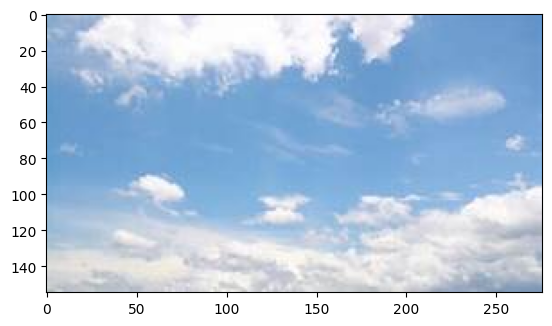

In [15]:
# displaying with cloud image
img = mpimg.imread('/content/cloudimages/cloud101.jpg')
imgplot = plt.imshow(img)
plt.show()

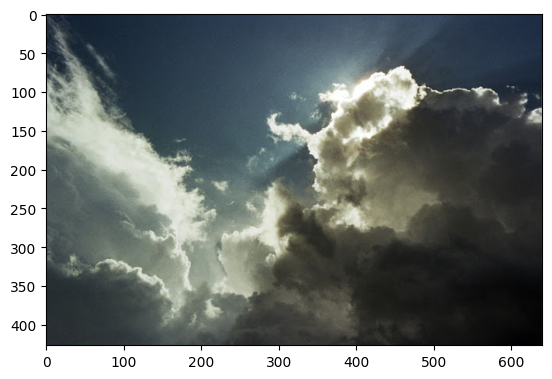

In [16]:
# displaying with raincloud image
img = mpimg.imread('/content/raincloudimages/RainCloud (103).jpg')
imgplot = plt.imshow(img)
plt.show()

## Displaying every cloud images

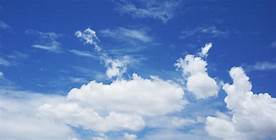

cloud 1


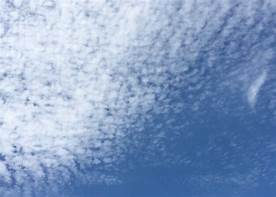

cloud 2


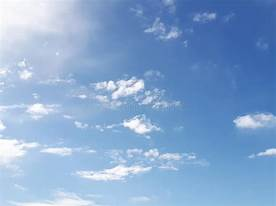

cloud 3


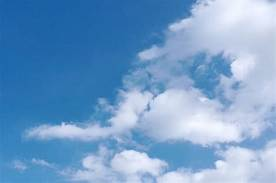

cloud 4


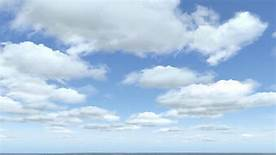

cloud 5


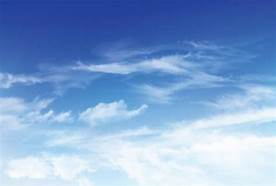

cloud 6


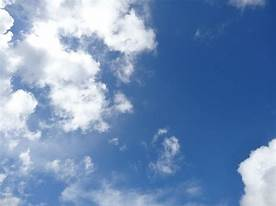

cloud 7


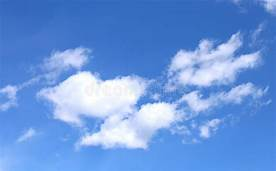

cloud 8


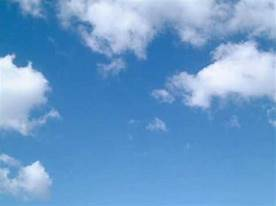

cloud 9


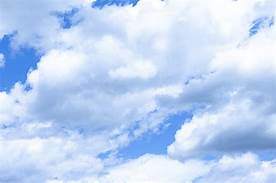

cloud 10


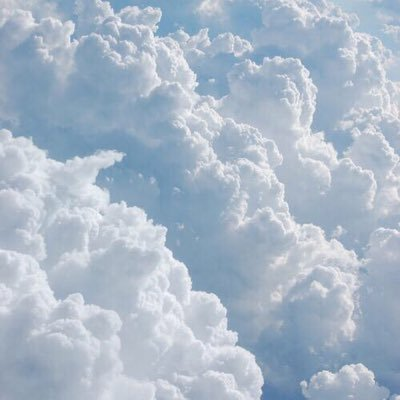

cloud 11


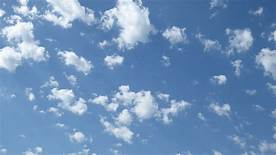

cloud 12


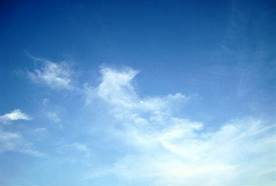

cloud 13


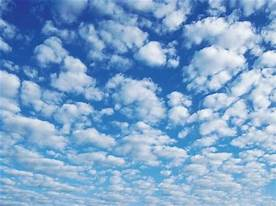

cloud 14


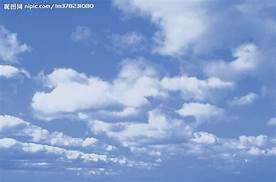

cloud 15


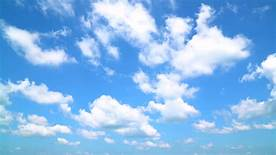

cloud 16


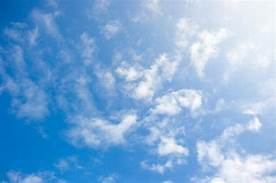

cloud 17


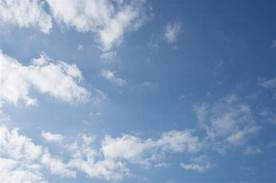

cloud 18


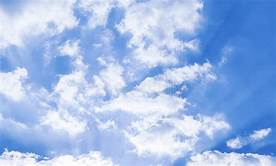

cloud 19


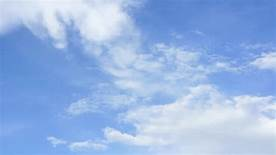

cloud 20


In [19]:

import os

# Define the directory containing the images
image_dir = '/content/cloudimages'

# List all files in the directory
image_files = os.listdir(image_dir)
i = 1

# Loop through each image file
for image_file in image_files:
    if i > 20:  # Break the loop after 20 images
        break

    # Read the image
    image_path = os.path.join(image_dir, image_file)
    image = cv2.imread(image_path)

    # Display the image
    cv2_imshow(image)
    print("cloud", i)
    i += 1


## Displaying the all raincloud images

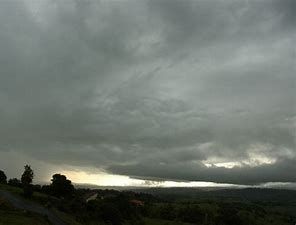

cloud 1


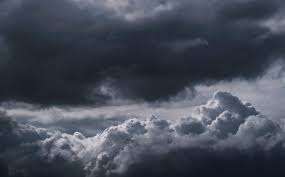

cloud 2


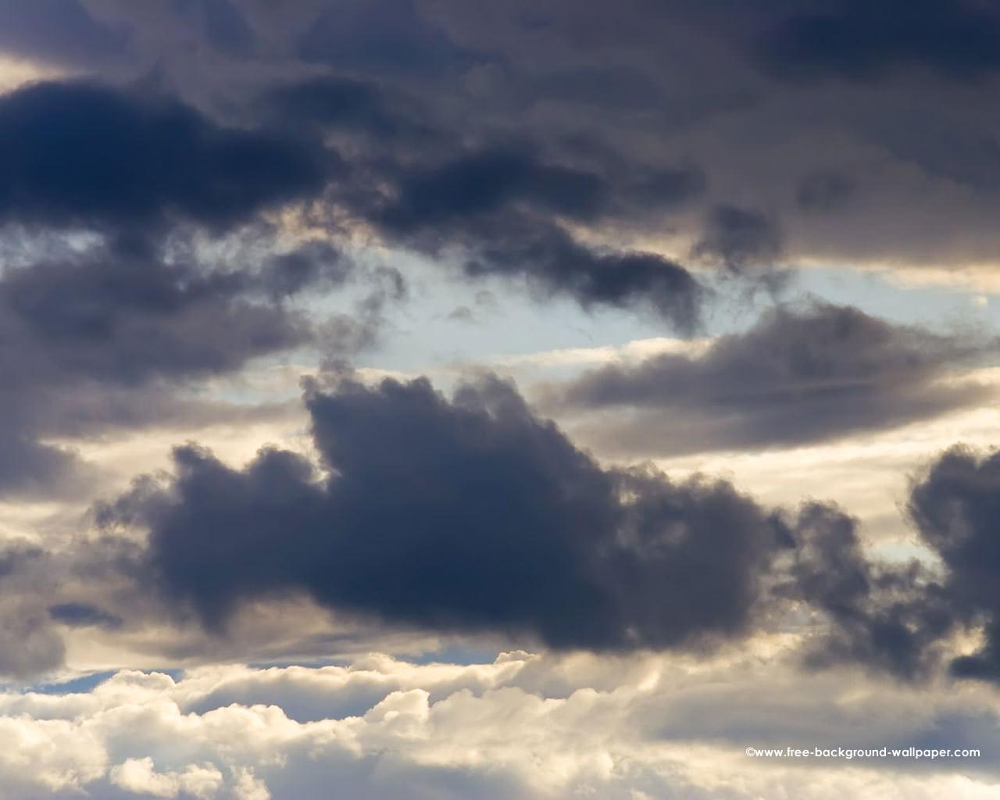

cloud 3


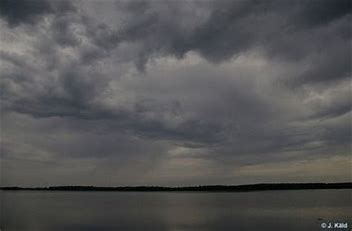

cloud 4


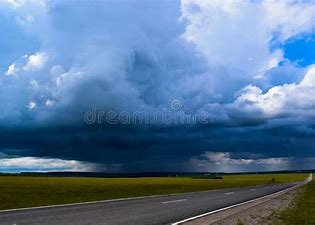

cloud 5


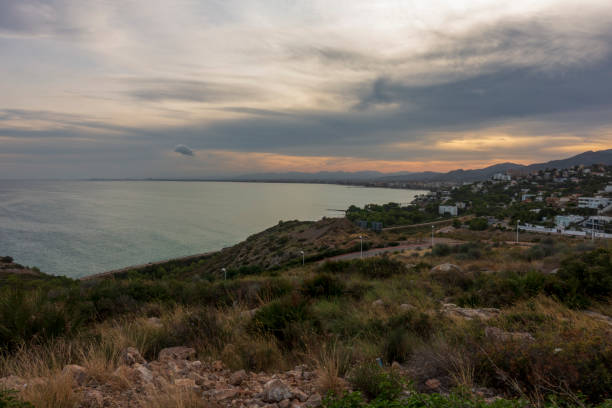

cloud 6


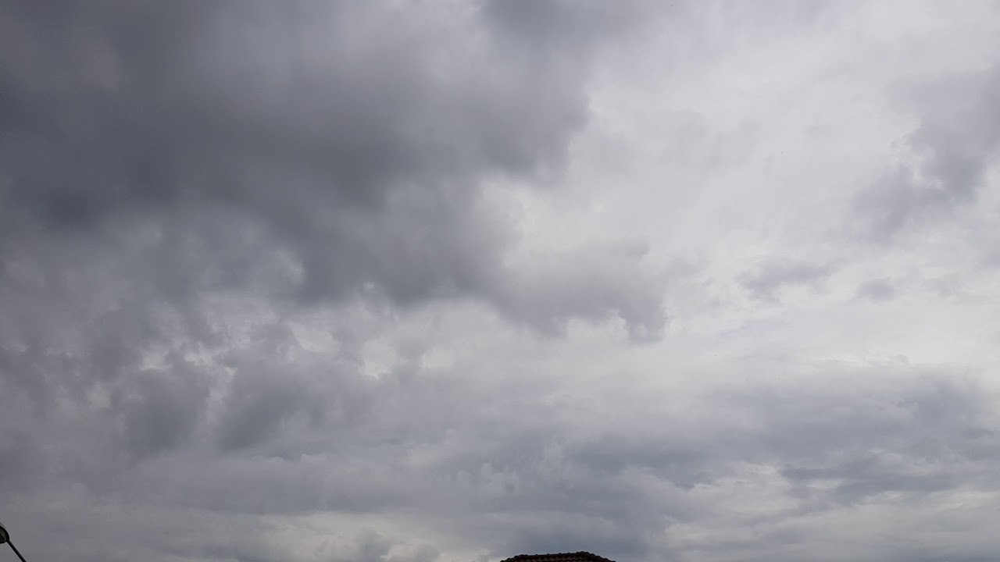

cloud 7


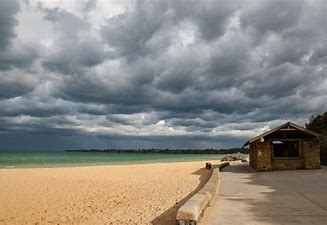

cloud 8


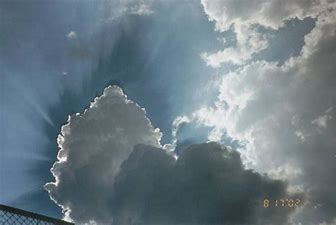

cloud 9


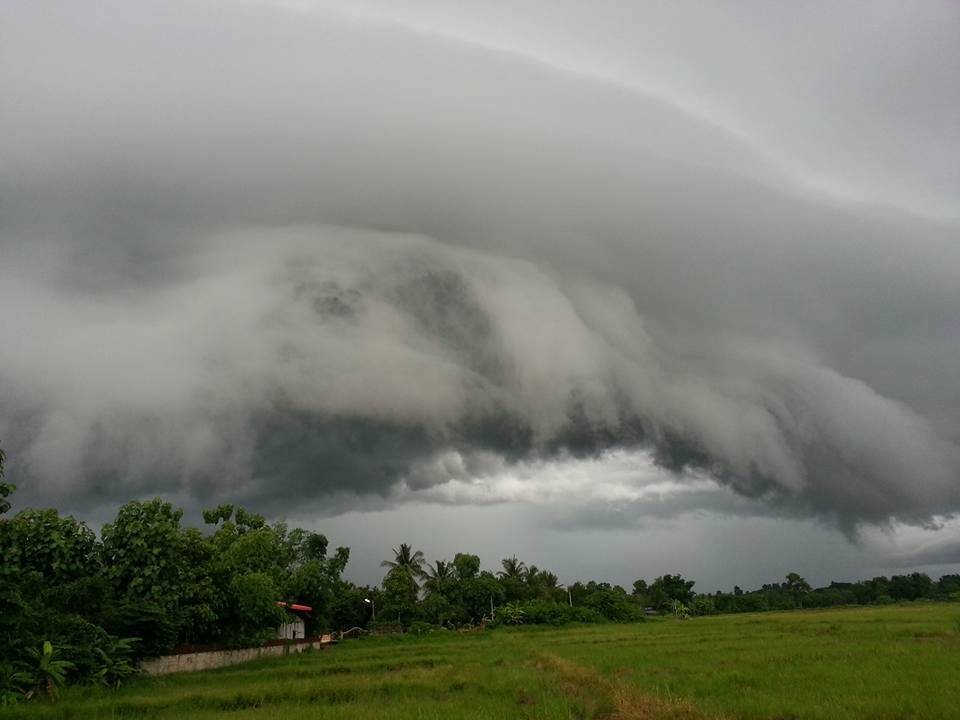

cloud 10


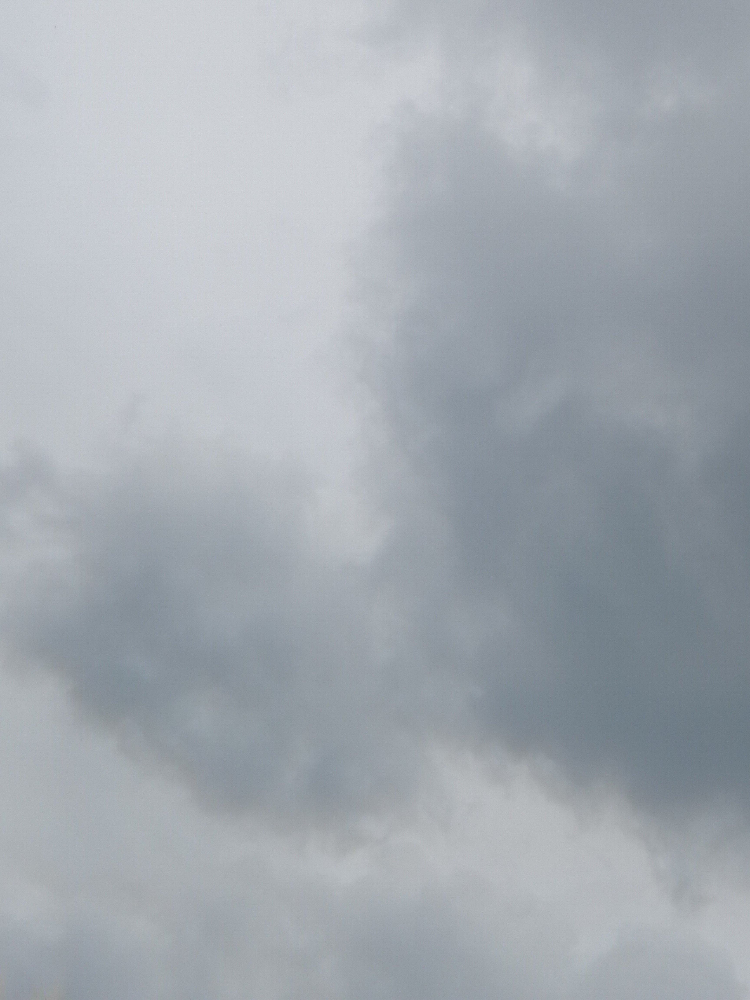

cloud 11


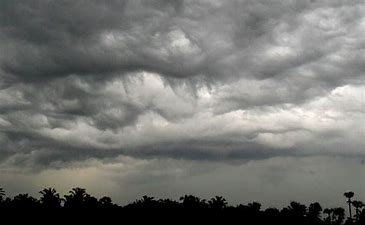

cloud 12


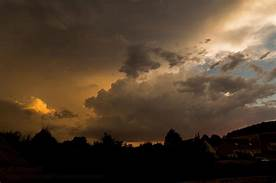

cloud 13


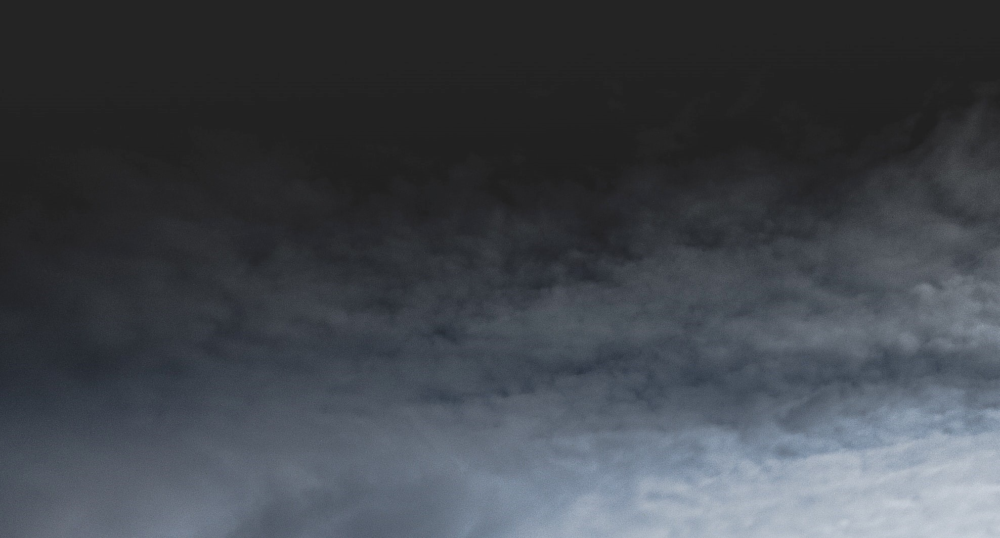

cloud 14


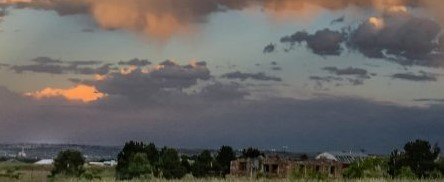

cloud 15


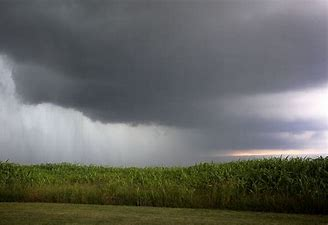

cloud 16


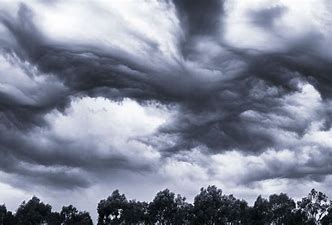

cloud 17


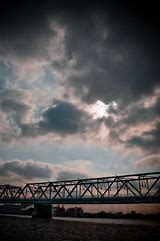

cloud 18


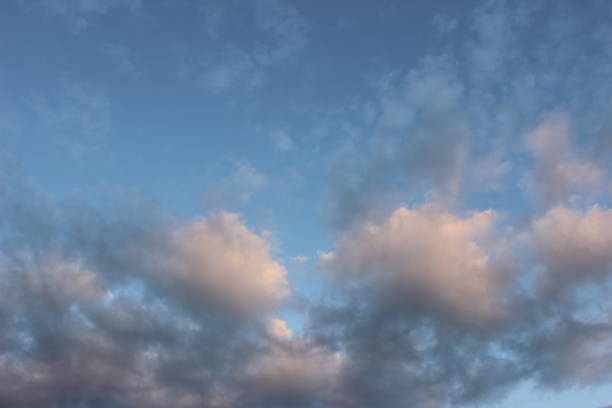

cloud 19


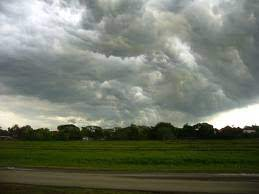

cloud 20


In [20]:

# Define the directory containing the images
image_dir = '/content/raincloudimages'

# List all files in the directory
image_files = os.listdir(image_dir)
i = 1

# Loop through each image file
for image_file in image_files:
    if i > 20:  # Break the loop after 20 images
        break

    # Read the image
    image_path = os.path.join(image_dir, image_file)
    image = cv2.imread(image_path)

    # Display the image
    cv2_imshow(image)
    print("cloud", i)
    i += 1


## Comparing the shapes of clouds and rainclouds

There are the normal clouds indicate that the no rain and clouds are in white colour.
Now that normal clouds we can see the different shapes. As we can see in the above images

Then rainclouds images having the black or red in  colour clouds that indicates that rain is coming.In rainclouds images also having different shapes in sky.

### Image Processing
1.Resize  image

2.Converting the images into numpy arrays

In [21]:
# convert images to numpy arrays

cloudimages = '/content/cloudimages/'
data = []

for img_file in os.listdir(cloudimages):
  image = Image.open(cloudimages + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

raincloudimages = '/content/raincloudimages/'

for img_file in os.listdir(raincloudimages):
  image = Image.open(raincloudimages + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

In [22]:
type(data)

list

In [23]:
len(data)

1200

array([[[ 36,  73, 154],
        [ 37,  74, 155],
        [ 35,  72, 153],
        ...,
        [ 34,  63, 141],
        [ 36,  63, 142],
        [ 36,  63, 142]],

       [[ 35,  72, 153],
        [ 36,  73, 154],
        [ 35,  72, 153],
        ...,
        [ 34,  63, 141],
        [ 36,  63, 142],
        [ 36,  63, 142]],

       [[ 34,  71, 152],
        [ 35,  72, 153],
        [ 35,  72, 153],
        ...,
        [ 34,  63, 141],
        [ 36,  63, 142],
        [ 36,  63, 142]],

       ...,

       [[174, 189, 210],
        [174, 189, 210],
        [173, 189, 210],
        ...,
        [109, 135, 178],
        [115, 139, 182],
        [114, 138, 181]],

       [[176, 191, 212],
        [176, 191, 212],
        [176, 191, 212],
        ...,
        [101, 129, 175],
        [106, 133, 178],
        [107, 133, 178]],

       [[178, 193, 214],
        [178, 193, 214],
        [178, 193, 214],
        ...,
        [ 95, 126, 173],
        [104, 132, 179],
        [108, 135, 182]]], dtype=uint8)
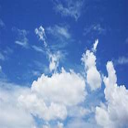

In [24]:
data[0]

array([[[ 63,  70,  88],
        [ 67,  74,  92],
        [ 74,  81,  99],
        ...,
        [ 70,  79,  96],
        [ 64,  73,  90],
        [ 64,  73,  90]],

       [[ 67,  74,  92],
        [ 71,  78,  96],
        [ 77,  84, 102],
        ...,
        [ 68,  77,  94],
        [ 65,  74,  91],
        [ 64,  73,  90]],

       [[ 73,  80,  98],
        [ 76,  83, 101],
        [ 80,  87, 105],
        ...,
        [ 67,  76,  93],
        [ 65,  74,  91],
        [ 67,  76,  93]],

       ...,

       [[ 15,  22,  32],
        [ 17,  24,  34],
        [ 20,  27,  37],
        ...,
        [ 17,  24,  34],
        [ 16,  23,  33],
        [ 16,  23,  33]],

       [[ 14,  21,  32],
        [ 17,  23,  34],
        [ 19,  26,  36],
        ...,
        [ 16,  23,  33],
        [ 15,  22,  32],
        [ 15,  22,  32]],

       [[ 15,  23,  31],
        [ 16,  24,  32],
        [ 18,  27,  35],
        ...,
        [ 15,  23,  31],
        [ 14,  22,  30],
        [ 14,  22,  30]]], dtype=uint8)
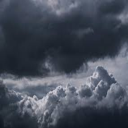

In [25]:
data[601]

In [26]:
data[0].shape

(128, 128, 3)

In [27]:
data

[array([[[ 36,  73, 154],
         [ 37,  74, 155],
         [ 35,  72, 153],
         ...,
         [ 34,  63, 141],
         [ 36,  63, 142],
         [ 36,  63, 142]],
 
        [[ 35,  72, 153],
         [ 36,  73, 154],
         [ 35,  72, 153],
         ...,
         [ 34,  63, 141],
         [ 36,  63, 142],
         [ 36,  63, 142]],
 
        [[ 34,  71, 152],
         [ 35,  72, 153],
         [ 35,  72, 153],
         ...,
         [ 34,  63, 141],
         [ 36,  63, 142],
         [ 36,  63, 142]],
 
        ...,
 
        [[174, 189, 210],
         [174, 189, 210],
         [173, 189, 210],
         ...,
         [109, 135, 178],
         [115, 139, 182],
         [114, 138, 181]],
 
        [[176, 191, 212],
         [176, 191, 212],
         [176, 191, 212],
         ...,
         [101, 129, 175],
         [106, 133, 178],
         [107, 133, 178]],
 
        [[178, 193, 214],
         [178, 193, 214],
         [178, 193, 214],
         ...,
         [ 95, 126, 173],
  

In [28]:
type(data[0])

numpy.ndarray

In [29]:
labels=clouds_labels+rainclouds_labels
len(labels)

1200

In [30]:
x=np.array(data)
y=np.array(labels)

In [31]:
type(x)

numpy.ndarray

In [32]:
type(y)

numpy.ndarray

In [33]:
print(x.shape)
print(y.shape)

(1200, 128, 128, 3)
(1200,)


### Spliting the data train and test data

In [34]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=2)

In [35]:
x_train.shape

(960, 128, 128, 3)

In [36]:
x_test.shape

(240, 128, 128, 3)

In [37]:
y_train.shape

(960,)

In [38]:
y_test.shape

(240,)

### Scaling the data

In [39]:

x_train_scaled = x_train/255

x_test_scaled = x_test/255

In [40]:
x_train_scaled[0]

array([[[0.17254902, 0.20784314, 0.25490196],
        [0.14509804, 0.18431373, 0.24313725],
        [0.09803922, 0.14901961, 0.21176471],
        ...,
        [0.12156863, 0.18039216, 0.27843137],
        [0.12156863, 0.17647059, 0.28235294],
        [0.11764706, 0.17647059, 0.25882353]],

       [[0.24705882, 0.27843137, 0.32156863],
        [0.15686275, 0.19215686, 0.25098039],
        [0.09803922, 0.15294118, 0.21176471],
        ...,
        [0.11764706, 0.18039216, 0.2745098 ],
        [0.12156863, 0.17647059, 0.2745098 ],
        [0.12156863, 0.17647059, 0.26666667]],

       [[0.21568627, 0.24313725, 0.29019608],
        [0.21960784, 0.25490196, 0.29411765],
        [0.11372549, 0.16078431, 0.20784314],
        ...,
        [0.11764706, 0.17647059, 0.26666667],
        [0.12156863, 0.17647059, 0.27058824],
        [0.11372549, 0.17254902, 0.25882353]],

       ...,

       [[0.15686275, 0.18431373, 0.20392157],
        [0.15686275, 0.18039216, 0.19607843],
        [0.16078431, 0

In [41]:
x_test_scaled[0]

array([[[0.37647059, 0.51372549, 0.6       ],
        [0.38431373, 0.52156863, 0.60784314],
        [0.39215686, 0.52941176, 0.61568627],
        ...,
        [0.64705882, 0.72156863, 0.78039216],
        [0.63921569, 0.71372549, 0.77254902],
        [0.63921569, 0.71372549, 0.77254902]],

       [[0.38431373, 0.51372549, 0.60392157],
        [0.38823529, 0.52156863, 0.60784314],
        [0.39607843, 0.52941176, 0.61568627],
        ...,
        [0.62352941, 0.69803922, 0.76078431],
        [0.61176471, 0.69019608, 0.75294118],
        [0.61176471, 0.69019608, 0.75294118]],

       [[0.39215686, 0.51764706, 0.60784314],
        [0.4       , 0.5254902 , 0.61568627],
        [0.40784314, 0.53333333, 0.62352941],
        ...,
        [0.58823529, 0.6745098 , 0.74509804],
        [0.59215686, 0.68235294, 0.75294118],
        [0.59215686, 0.68235294, 0.75294118]],

       ...,

       [[0.1372549 , 0.41960784, 0.40784314],
        [0.09803922, 0.38039216, 0.36862745],
        [0.10980392, 0

## Building a Model using VGG16


In [42]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [51]:
from tensorflow.keras.applications.vgg16 import VGG16

base_model = VGG16(input_shape = (128, 128, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

58889256/58889256 [==============================] - 0s 0us/step


In [52]:
for layer in base_model.layers:
    layer.trainable = False

In [55]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0     

In [56]:
#Creating the Head of the model
model = Flatten()(base_model.output)

model = Dense(units=1024, activation="relu")(model)
model = Dense(units=512, activation="relu")(model)

prediction_layer = Dense(units=2, activation="softmax")(model)

In [60]:
# Joining the head and body
from tensorflow.keras.models import Model

model = Model(inputs= base_model.input, outputs = prediction_layer)

In [61]:
#Summarising the model
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 32, 32, 128)       0   

In [70]:
model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=["sparse_categorical_accuracy"], run_eagerly=True)


In [ ]:
vgghist = model.fit(x_train_scaled, y_train, validation_data=(x_test_scaled, y_test), epochs=5, batch_size=32)


Epoch 1/5
30/30 [==============================] - 706s 24s/step - loss: 0.2532 - sparse_categorical_accuracy: 0.8917 - val_loss: 0.0651 - val_sparse_categorical_accuracy: 0.9750
Epoch 2/5
30/30 [==============================] - 706s 24s/step - loss: 0.0975 - sparse_categorical_accuracy: 0.9677 - val_loss: 0.0469 - val_sparse_categorical_accuracy: 0.9792
Epoch 3/5
30/30 [==============================] - 709s 24s/step - loss: 0.0630 - sparse_categorical_accuracy: 0.9792 - val_loss: 0.0850 - val_sparse_categorical_accuracy: 0.9667
Epoch 4/5
30/30 [==============================] - 667s 22s/step - loss: 0.0432 - sparse_categorical_accuracy: 0.9833 - val_loss: 0.0517 - val_sparse_categorical_accuracy: 0.9792
Epoch 5/5
30/30 [==============================] - ETA: 0s - loss: 0.0104 - sparse_categorical_accuracy: 0.9979 

### Model Evaluation

#### Accuracy Score

In [79]:
# Evaluate the model on the test data
loss, accuracy = model.evaluate(x_test_scaled, y_test)

# Print the accuracy score
print("Accuracy:", accuracy)


8/8 [==============================] - 44s 6s/step - loss: 0.0415 - sparse_categorical_accuracy: 0.9875
Accuracy: 0.987500011920929


In [80]:
from sklearn.metrics import f1_score, recall_score, confusion_matrix

# Make predictions on the test data
y_pred = model.predict(x_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)

8/8 [==============================] - 44s 5s/step


#### F1 Score

In [84]:
# Calculate F1 score
f1 = f1_score(y_test, y_pred_classes)
print("The F1 Score is:",f1)

The F1 Score is: 0.9868995633187774


#### Calculating the recall score

In [85]:
recall = recall_score(y_test, y_pred_classes)
print("The Recall Score:",recall)

The Recall Score: 0.9912280701754386


#### Confusion Matrix

In [86]:
conf_matrix = confusion_matrix(y_test, y_pred_classes)
print("Confusion Matrix:",conf_matrix)

Confusion Matrix: [[124   2]
 [  1 113]]


### Predictive System

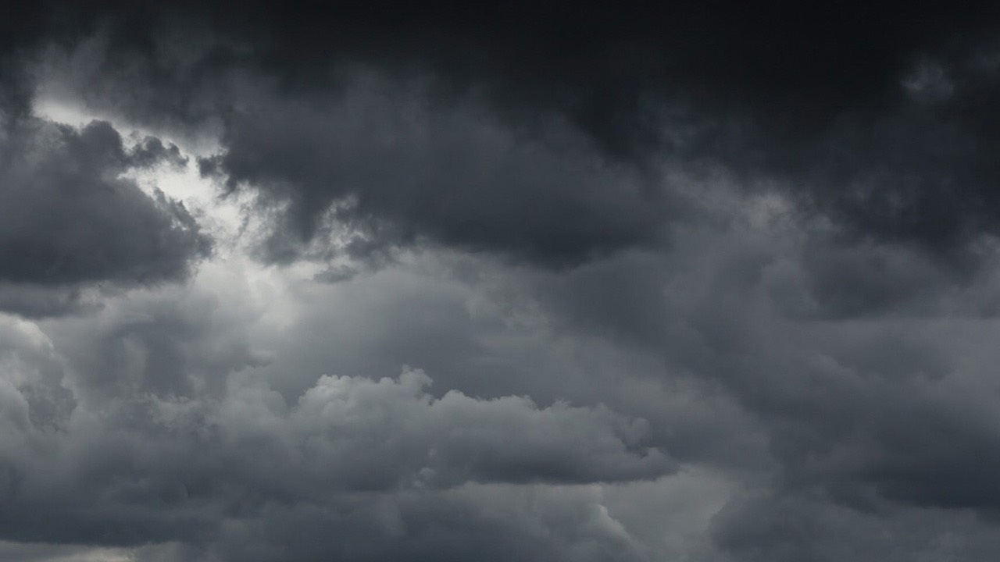

1/1 [==============================] - 0s 347ms/step
[[7.7640198e-06 9.9999225e-01]]
1
it is  ready to rain


In [78]:
input_image_path = '/content/raincloudimages/RainCloud (101).jpg'

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resized = cv2.resize(input_image, (128,128))

input_image_scaled = input_image_resized/255

input_image_reshaped = np.reshape(input_image_scaled, [1,128,128,3])

input_prediction = model.predict(input_image_reshaped)

print(input_prediction)


input_pred_label = np.argmax(input_prediction)

print(input_pred_label)


if input_pred_label == 0:

  print('it will not rain')

else:

  print('it is  ready to rain')